# Single label Classifier (Multiple leads) - AF Detection

In [1]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [2]:
import sys
sys.path.append("../../tutorials/fastai/old/") # go to parent dir

from fastai.imports import *
from fastai.structured import *

from pandas_summary import DataFrameSummary
from sklearn.ensemble import RandomForestClassifier
from IPython.display import display

from sklearn import metrics
from sklearn.metrics import f1_score, fbeta_score


Bad key "text.kerning_factor" on line 4 in
/home/tom/anaconda3/envs/fastai/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


## Helper functions

In [3]:
def display_all(df):
    with pd.option_context("display.max_rows", 1000, "display.max_columns", 1000): 
        display(df)

In [4]:
def print_fscores(m, X_valid, y_valid):
    res = [f1_score(y_valid, m.predict(X_valid), average='weighted'), fbeta_score(y_valid, m.predict(X_valid), beta=2)]
    print(res)

### Lead 1 data:

In [13]:
df_raw_1 = pd.read_feather('datasets/base/pyhs-raw-corrected')
display_all(df_raw_1.T)

0            1            2            3     \
age                      64           24           59           14   
sex                       1            1            0            1   
fmax                8.20328      2.15043      1.05485      7.64504   
mean_RR             4460.78      9963.95      7031.67      6695.09   
mean_R_Peaks         190690       161291       228946  4.04914e+06   
mean_T_Peaks        84.1667      183.905      120.467      56.7143   
mean_P_Peaks        77.6667      44.0476      58.7333      57.1905   
mean_Q_Peaks         -32.75     -38.1905        -36.2     -148.619   
mean_S_Peaks       -46.6667     -212.048     -130.267     -121.952   
median_RR              4017         9914         6993         6660   
median_R_Peaks       163434       245336       183364  4.22689e+06   
std_RR              2788.58      5793.79      4059.13      4090.41   
std_R_Peaks          170403       120275       214377       884262   
var_RR          8.23363e+06  3.43673e+07  1.70447e+07  1.75282e+07   
var_R_Peaks     3.07451e+10  1.48104e+10  4.75421e+10  8.19154e+11   
skew_RR            0.326896   0.00822937    0.0160395    0.0310137   
skew_R_Peaks       0.452789   -0.0122815     0.102263     -4.32584   
kurt_RR             -1.1146     -1.19623     -1.17866     -1.22044   
kurt_R_Peaks       -1.28517     -1.95524     -1.85952      16.8351   
mean_P_Onsets       4617.67      10309.6      6736.27      6795.24   
mean_T_Offsets      5106.17      10776.3       7255.6      7248.29   
HRV                 300.262      252.052       247.39      319.845   
label                   PAC       Normal          PAC       Normal   

                       4            5            6            7     \
age                      40           64           56           76   
sex                       1            0            0            0   
fmax                2.18261      3.89556      17.0068      1.80072   
mean_RR             5615.25       9609.8      4754.85      4782.45   
mean_R_Peaks    1.30268e+06       280331       331673       104983   
mean_T_Peaks            196       133.88      63.4167      60.7857   
mean_P_Peaks        40.8182         2.92         0.25      67.6429   
mean_Q_Peaks       -218.636        -70.8     -13.3333     -26.3571   
mean_S_Peaks       -259.455       -80.24     -157.833     -129.214   
median_RR              5640         9780         4879         4504   
median_R_Peaks  1.11847e+06      28940.1        13556       102426   
std_RR              3206.38      5480.42       2831.8      3017.22   
std_R_Peaks     1.26993e+06       268252       354536        44664   
var_RR          1.07279e+07  3.06357e+07  8.33985e+06  9.53712e+06   
var_R_Peaks     1.68284e+12  7.33984e+10  1.30724e+11  2.08987e+09   
skew_RR           -0.014445   -0.0355583    0.0221538    0.0949298   
skew_R_Peaks      0.0459666     0.163273     0.207103   0.00224062   
kurt_RR             -1.2168     -1.19116     -1.09702     -1.29848   
kurt_R_Peaks       -1.94023     -1.80995     -1.88757    -0.886534   
mean_P_Onsets       5709.27      9375.28       4810.5      5261.14   
mean_T_Offsets      6233.82      9916.24      5340.17      5768.57   
HRV                 237.255      194.175      205.367      239.317   
label                  RBBB        I-AVB           AF           AF   

                       8            9            10           11    \
age                      89           42           80           62   
sex                       0            1            1            0   
fmax                4.30172      1.40056     0.785939      3.36088   
mean_RR              4958.5      5027.26      7077.64      15260.4   
mean_R_Peaks    1.52599e+06       186787       179436  2.54788e+06   
mean_T_Peaks        39.4615      203.538      44.8947      6.87179   
mean_P_Peaks        10.7857      33.4615      31.7368      28.8718   
mean_Q_Peaks       -74.3571     -87.1538     -20.8947     -116.333   
mean_S_Peaks         -137.5    

In [14]:
df_raw_2 = pd.read_feather('datasets/multilead/pyhs-raw-lead2-corrected')
display_all(df_raw_2.T)

0            1            2            3     \
age                      64           24           59           14   
sex                       1            1            0            1   
fmax                4.60184      1.05021      1.05485      4.57274   
mean_RR             5164.82      9965.07      7262.19         6977   
mean_R_Peaks    3.21419e+06  1.42354e+06       782051       544773   
mean_T_Peaks        115.636       371.35      172.267      108.762   
mean_P_Peaks        13.1818     -19.5714     -8.73333      44.0476   
mean_Q_Peaks       -114.364     -114.714     -95.9333     -72.4762   
mean_S_Peaks       -54.0909      -270.81     -39.0667     -157.095   
median_RR              5166         9920         7150         7275   
median_R_Peaks   4.3649e+06  2.37452e+06      43328.4       615665   
std_RR              2986.46      5793.85      4186.15      4060.39   
std_R_Peaks     2.39316e+06  1.26495e+06       779588       204638   
var_RR          9.47635e+06   3.4368e+07   1.8108e+07  1.72036e+07   
var_R_Peaks     6.08516e+12   1.6382e+12  6.28016e+11  4.36973e+10   
skew_RR           0.0022395   0.00818842   0.00841972    -0.099483   
skew_R_Peaks      -0.497951   -0.0336479     0.119925     -2.12018   
kurt_RR            -1.25653     -1.19657     -1.19276     -1.21384   
kurt_R_Peaks       -1.59331     -1.98235     -1.89579      2.76596   
mean_P_Onsets       5029.09      10306.8       6725.6       6830.1   
mean_T_Offsets      5508.91          NaN      7256.93      7244.29   
HRV                 324.786       250.69      244.448      297.769   
label                   PAC       Normal          PAC       Normal   

                       4            5            6            7     \
age                      40           64           56           76   
sex                       1            0            0            0   
fmax                8.54856      3.89556      1.30052       7.0028   
mean_RR                4981      9610.75      4971.92       5241.4   
mean_R_Peaks    1.03544e+06       464155       366945   1.1063e+06   
mean_T_Peaks        25.8182       175.64       164.25      40.2667   
mean_P_Peaks        95.2727         16.6      1.33333           34   
mean_Q_Peaks       -62.3636      -113.76     -55.5833     -42.4667   
mean_S_Peaks       -360.364       -43.32     -166.333     -165.267   
median_RR              4715         9782         5016         5534   
median_R_Peaks  1.70297e+06      57474.8        60437  1.33159e+06   
std_RR               3011.1      5480.61      2985.73      2827.17   
std_R_Peaks          842957       436835       353303       573251   
var_RR           9.5439e+06  3.06378e+07  9.28603e+06  8.41357e+06   
var_R_Peaks     7.47975e+11  1.94642e+11  1.30024e+11  3.45912e+11   
skew_RR            0.134001   -0.0355991   -0.0700177    -0.166069   
skew_R_Peaks      -0.406748     0.132798      0.19688      -1.1105   
kurt_RR            -1.14666     -1.19105     -1.23791     -1.14911   
kurt_R_Peaks       -1.83252      -1.8626     -1.82098    -0.275214   
mean_P_Onsets       5675.82      9379.76       4792.5       5127.2   
mean_T_Offsets      6216.55      9913.76      5332.83      5652.93   
HRV                 286.387      194.706      212.797       265.59   
label                  RBBB        I-AVB           AF           AF   

                       8            9            10           11    \
age                      89           42           80           62   
sex                       0            1            1            0   
fmax                4.30172      2.10084      2.21492      1.57252   
mean_RR             5190.95      4933.36      7069.45      15739.2   
mean_R_Peaks         791539  1.67609e+06       617527  2.65317e+06   
mean_T_Peaks        5.53846     -24.1538     -6.31579     -20.8421   
mean_P_Peaks        56.7143      58.9231      3.63158      92.8649   
mean_Q_Peaks       -50.9286      12.7692    -0.315789     -52.1316   
mean_S_Peaks       -104.214    

In [15]:
df_raw_3 = pd.read_feather('datasets/multilead/pyhs-raw-lead3-corrected')
display_all(df_raw_3.T)

0            1            2            3     \
age                      64           24           59           14   
sex                       1            1            0            1   
fmax                4.60184      1.05021       3.3052      3.07231   
mean_RR             5338.44      10673.9      6929.33      7017.83   
mean_R_Peaks    1.97854e+06       869375       286573  1.95442e+06   
mean_T_Peaks        34.8333        184.1           57      27.4762   
mean_P_Peaks       -10.8333     -43.5238     -52.0667      36.8095   
mean_Q_Peaks       -79.0833     -68.4286     -65.4667     -34.1429   
mean_S_Peaks          -2.75     -89.0952      1.93333     -810.714   
median_RR              5586        10798         6549         6968   
median_R_Peaks  2.35302e+06  1.44755e+06       203676  2.12784e+06   
std_RR               2785.3      5591.39      4116.58       4266.2   
std_R_Peaks     1.70949e+06       738232       297286       607762   
var_RR          8.21426e+06  3.20864e+07  1.75305e+07  1.90277e+07   
var_R_Peaks     3.09424e+12  5.59328e+11  9.14268e+10  3.86164e+11   
skew_RR            -0.15566    -0.133419    0.0936033     0.021335   
skew_R_Peaks    -0.00230093    -0.247003     0.309619     -2.81932   
kurt_RR           -0.904563      -1.0836     -1.21734      -1.2337   
kurt_R_Peaks       -1.55954     -1.92351     -1.44357      6.20946   
mean_P_Onsets       4628.67      10282.5      6807.33       6694.1   
mean_T_Offsets       5093.5          NaN      7272.53      7197.14   
HRV                 308.685      280.765      254.653      315.985   
label                   PAC       Normal          PAC       Normal   

                       4            5            6            7     \
age                      40           64           56           76   
sex                       1            0            0            0   
fmax                1.09131     0.315856      1.20048      1.80072   
mean_RR             5618.33      9250.47      4902.08      4852.95   
mean_R_Peaks         433072        86255      46994.7       625166   
mean_T_Peaks       -11.1667        42.48      113.167      55.5333   
mean_P_Peaks        135.167        24.28      59.3333      32.2667   
mean_Q_Peaks       -306.667        -64.2     -22.4167        -42.6   
mean_S_Peaks       -172.333        -8.56        -9.75     -67.7333   
median_RR              5645         9042         5163         4778   
median_R_Peaks       385808      61880.8        31467       746246   
std_RR              3204.89      5584.88      2986.83      2866.87   
std_R_Peaks          394557        92109        37234       355832   
var_RR          1.07179e+07  3.19336e+07    9.278e+06   8.6299e+06   
var_R_Peaks     1.62443e+11  8.68607e+09  1.44182e+09  1.32947e+11   
skew_RR          -0.0147115     0.103401   -0.0367283    0.0681823   
skew_R_Peaks      0.0231069     0.820832     0.689119    -0.708731   
kurt_RR            -1.21756     -1.18126     -1.26753     -1.23238   
kurt_R_Peaks       -1.97031    -0.733866      -0.3981    -0.787312   
mean_P_Onsets          5337      9381.84      4949.17         5128   
mean_T_Offsets      5717.83      9936.56      5326.83      5659.87   
HRV                 239.914      240.495      209.399      249.839   
label                  RBBB        I-AVB           AF           AF   

                       8            9            10           11    \
age                      89           42           80           62   
sex                       0            1            1            0   
fmax                1.40056      1.40056      2.21492      1.14085   
mean_RR                5118      4747.71      7071.03      15934.5   
mean_R_Peaks         193846  2.68384e+06       309041       813540   
mean_T_Peaks        57.6923         -166     -17.8947     -37.4737   
mean_P_Peaks        59.0714      38.3077      21.7368      108.211   
mean_Q_Peaks       -53.2143     -49.4615     -18.2632     -3.39474   
mean_S_Peaks         -135.5    

In [16]:
df_raw_aVR = pd.read_feather('datasets/multilead/pyhs-raw-leadAVR-corrected')
display_all(df_raw_aVR.T)

0            1            2            3     \
age                      64           24           59           14   
sex                       1            1            0            1   
fmax                4.60184      1.05021      1.05485      4.57274   
mean_RR              4827.3      9963.35      7031.27      6691.73   
mean_R_Peaks    1.00933e+06       594273       447974  1.80819e+06   
mean_T_Peaks             57         9.35      9.26667       50.619   
mean_P_Peaks        71.3636      80.4762      62.8667      101.571   
mean_Q_Peaks       -208.273     -450.095       -441.4     -699.476   
mean_S_Peaks       -557.455        25.15        -20.2     -80.9048   
median_RR              4471         9918         6991         6659   
median_R_Peaks  1.70401e+06       959986       415840  1.89347e+06   
std_RR              2914.86      5793.69      4058.47      4092.18   
std_R_Peaks          894002       506033       423640       393867   
var_RR          8.94359e+06  3.43661e+07  1.70391e+07  1.75433e+07   
var_R_Peaks     8.41305e+11  2.62166e+11   1.8566e+11  1.62518e+11   
skew_RR            0.207141   0.00814005    0.0161924     0.029258   
skew_R_Peaks       -0.18859   -0.0321471    0.0257169     -4.31432   
kurt_RR            -1.17445     -1.19651     -1.17856     -1.21894   
kurt_R_Peaks       -1.94838     -1.98101     -1.95894      16.7699   
mean_P_Onsets       4978.18      10370.3       6789.6      6856.29   
mean_T_Offsets      5407.27          NaN      7323.07      7363.62   
HRV                 277.174       250.72      246.828       320.28   
label                   PAC       Normal          PAC       Normal   

                       4            5            6            7     \
age                      40           64           56           76   
sex                       1            0            0            0   
fmax                2.18261      3.89556      1.30052       7.0028   
mean_RR             5618.58      9610.39      4969.92         5152   
mean_R_Peaks         975270       353320       344066       465103   
mean_T_Peaks              7        58.88      7.83333         51.6   
mean_P_Peaks        126.917         40.2        29.75         33.6   
mean_Q_Peaks       -636.417       -13.08     -396.583     -308.133   
mean_S_Peaks          38.75      -404.24     0.666667      47.9333   
median_RR              5641         9782         5024         5412   
median_R_Peaks       891643      39739.4      30271.9       518072   
std_RR              3207.05      5480.47      2987.14      2847.86   
std_R_Peaks          965185       328908       343816       209289   
var_RR          1.07323e+07  3.06362e+07  9.29477e+06  8.56087e+06   
var_R_Peaks     9.72086e+11  1.10344e+11  1.23135e+11  4.62355e+10   
skew_RR          -0.0140151   -0.0355397   -0.0690904    -0.109226   
skew_R_Peaks       0.018801    0.0545416     0.122838     -1.24428   
kurt_RR             -1.2159     -1.19116     -1.24004     -1.16554   
kurt_R_Peaks       -1.97542     -1.97562     -1.93354     0.377161   
mean_P_Onsets       5322.83      9322.88      4889.17      5228.67   
mean_T_Offsets         5777       9875.2       5330.5      5644.67   
HRV                 236.845      194.519      212.111      273.813   
label                  RBBB        I-AVB           AF           AF   

                       8            9            10           11    \
age                      89           42           80           62   
sex                       0            1            1            0   
fmax                4.30172      2.10084      2.21492      1.57252   
mean_RR             5189.89      4930.64      7050.19      16178.1   
mean_R_Peaks    1.14256e+06       512344       299656  2.44982e+06   
mean_T_Peaks        39.9231      146.077      44.8947      72.9737   
mean_P_Peaks        60.2143      21.5385      12.4737      47.9737   
mean_Q_Peaks       -668.357     -527.231     -350.105     -210.105   
mean_S_Peaks        39.4615    

In [17]:
df_raw_1['PT_duration'] = df_raw_1['mean_T_Offsets'] - df_raw_1['mean_P_Onsets']
df_raw_1.drop(['mean_T_Offsets', 'mean_P_Onsets'], axis=1, inplace=True)

df_raw_2['PT_duration'] = df_raw_2['mean_T_Offsets'] - df_raw_2['mean_P_Onsets']
df_raw_2.drop(['mean_T_Offsets', 'mean_P_Onsets'], axis=1, inplace=True)

df_raw_3['PT_duration'] = df_raw_3['mean_T_Offsets'] - df_raw_3['mean_P_Onsets']
df_raw_3.drop(['mean_T_Offsets', 'mean_P_Onsets'], axis=1, inplace=True)

df_raw_aVR['PT_duration'] = df_raw_aVR['mean_T_Offsets'] - df_raw_aVR['mean_P_Onsets']
df_raw_aVR.drop(['mean_T_Offsets', 'mean_P_Onsets'], axis=1, inplace=True)

In [18]:
com_cols = ['age', 'sex', 'label']

df_com = df_raw_1[com_cols]

In [19]:
lead_cols = ['fmax', 'mean_RR', 'mean_R_Peaks', 'mean_T_Peaks', 'mean_P_Peaks', 'mean_Q_Peaks', 'mean_S_Peaks', 'median_RR', 'median_R_Peaks', 'std_RR', 'std_R_Peaks', 'var_RR', 'var_R_Peaks', 'skew_RR', 'skew_R_Peaks', 'kurt_RR', 'kurt_R_Peaks', 'PT_duration', 'HRV']

df_raw_1 = df_raw_1[lead_cols].add_suffix('_l1')
df_raw_2 = df_raw_2[lead_cols].add_suffix('_l2')
df_raw_3 = df_raw_3[lead_cols].add_suffix('_l3')
df_raw_aVR = df_raw_aVR[lead_cols].add_suffix('_laVR')

In [22]:
#df_raw_2.drop(['age', 'sex', 'label'], inplace=True, axis=1)
#df_raw_3.drop(['age', 'sex', 'label'], inplace=True, axis=1)

In [20]:
df_aux = df_com.join(df_raw_1)

df_aux2 = df_aux.join(df_raw_2)

df_aux3 = df_aux2.join(df_raw_3)

df_merge = df_aux3.join(df_raw_aVR)

display_all(df_merge.T)

0            1            2            3     \
age                           64           24           59           14   
sex                            1            1            0            1   
label                        PAC       Normal          PAC       Normal   
fmax_l1                  8.20328      2.15043      1.05485      7.64504   
mean_RR_l1               4460.78      9963.95      7031.67      6695.09   
mean_R_Peaks_l1           190690       161291       228946  4.04914e+06   
mean_T_Peaks_l1          84.1667      183.905      120.467      56.7143   
mean_P_Peaks_l1          77.6667      44.0476      58.7333      57.1905   
mean_Q_Peaks_l1           -32.75     -38.1905        -36.2     -148.619   
mean_S_Peaks_l1         -46.6667     -212.048     -130.267     -121.952   
median_RR_l1                4017         9914         6993         6660   
median_R_Peaks_l1         163434       245336       183364  4.22689e+06   
std_RR_l1                2788.58      5793.79      4059.13      4090.41   
std_R_Peaks_l1            170403       120275       214377       884262   
var_RR_l1            8.23363e+06  3.43673e+07  1.70447e+07  1.75282e+07   
var_R_Peaks_l1       3.07451e+10  1.48104e+10  4.75421e+10  8.19154e+11   
skew_RR_l1              0.326896   0.00822937    0.0160395    0.0310137   
skew_R_Peaks_l1         0.452789   -0.0122815     0.102263     -4.32584   
kurt_RR_l1               -1.1146     -1.19623     -1.17866     -1.22044   
kurt_R_Peaks_l1         -1.28517     -1.95524     -1.85952      16.8351   
PT_duration_l1             488.5      466.667      519.333      453.048   
HRV_l1                   300.262      252.052       247.39      319.845   
fmax_l2                  4.60184      1.05021      1.05485      4.57274   
mean_RR_l2               5164.82      9965.07      7262.19         6977   
mean_R_Peaks_l2      3.21419e+06  1.42354e+06       782051       544773   
mean_T_Peaks_l2          115.636       371.35      172.267      108.762   
mean_P_Peaks_l2          13.1818     -19.5714     -8.73333      44.0476   
mean_Q_Peaks_l2         -114.364     -114.714     -95.9333     -72.4762   
mean_S_Peaks_l2         -54.0909      -270.81     -39.0667     -157.095   
median_RR_l2                5166         9920         7150         7275   
median_R_Peaks_l2     4.3649e+06  2.37452e+06      43328.4       615665   
std_RR_l2                2986.46      5793.85      4186.15      4060.39   
std_R_Peaks_l2       2.39316e+06  1.26495e+06       779588       204638   
var_RR_l2            9.47635e+06   3.4368e+07   1.8108e+07  1.72036e+07   
var_R_Peaks_l2       6.08516e+12   1.6382e+12  6.28016e+11  4.36973e+10   
skew_RR_l2             0.0022395   0.00818842   0.00841972    -0.099483   
skew_R_Peaks_l2        -0.497951   -0.0336479     0.119925     -2.12018   
kurt_RR_l2              -1.25653     -1.19657     -1.19276     -1.21384   
kurt_R_Peaks_l2         -1.59331     -1.98235     -1.89579      2.76596   
PT_duration_l2           479.818          NaN      531.333       414.19   
HRV_l2                   324.786       250.69      244.448      297.769   
fmax_l3                  4.60184      1.05021       3.3052      3.07231   
mean_RR_l3               5338.44      10673.9      6929.33      7017.83   
mean_R_Peaks_l3      1.97854e+06       869375       286573  1.95442e+06   
mean_T_Peaks_l3          34.8333        184.1           57      27.4762   
mean_P_Peaks_l3         -10.8333     -43.5238     -52.0667      36.8095   
mean_Q_Peaks_l3         -79.0833     -68.4286     -65.4667     -34.1429   
mean_S_Peaks_l3            -2.75     -89.0952      1.93333     -810.714   
median_RR_l3                5586        10798         6549         6968   
median_R_Peaks_l3    2.35302e+06  1.44755e+06       203676  2.12784e+06   
std_RR_l3                 2785.3      5591.39      4116.58       4266.2   
std_R_Peaks_l3       1.70949e+06       738232       297286       607762   
var_RR_l3            8.21426e+06  3.20864e+07  1.7530

In [21]:
df_raw = df_merge.copy()

In [22]:
labels = pd.get_dummies(df_raw['label'])
labels.describe()

,AF,I-AVB,LBBB,Normal,PAC,PVC,RBBB,STD,STE
count,6877.000000,6877.000000,6877.000000,6877.000000,6877.000000,6877.000000,6877.000000,6877.000000,6877.000000
mean,0.177548,0.104988,0.028937,0.133488,0.079104,0.091173,0.243566,0.114294,0.026901
std,0.382160,0.306560,0.167642,0.340127,0.269921,0.287877,0.429265,0.318191,0.161807
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Split between Train and Validation Datasets

### Training Set (80%) - Validation (20%)

In [23]:
df_af = df_raw[(df_raw.loc[:, 'label'] == 'AF')]
df_af.reset_index(inplace=True)
df_train_af = df_af.sample(frac=0.8)

id_train = list(df_train_af.index)
id_valid = [y for y in range(len(df_af)) if y not in id_train]
df_valid_af = df_af.loc[id_valid,:]
len(df_valid_af), len(df_train_af), len(df_af)

(244, 977, 1221)

In [24]:
df_rest = df_raw[(df_raw.loc[:, 'label'] != 'AF')]
df_rest.reset_index(inplace=True)
df_train_rest = df_rest.sample(frac=0.8)

id_train = list(df_train_rest.index)
id_valid = [y for y in range(len(df_rest)) if y not in id_train]

df_valid_rest = df_rest.loc[id_valid,:]
len(df_valid_rest), len(df_train_rest), len(df_rest)

(1131, 4525, 5656)

### We check to see if the labels we sampled in the same proportion as they appear in the original dataset

In [25]:
labels = pd.get_dummies(df_train_rest['label'])
labels.describe()

,I-AVB,LBBB,Normal,PAC,PVC,RBBB,STD,STE
count,4525.000000,4525.000000,4525.000000,4525.000000,4525.000000,4525.000000,4525.000000,4525.000000
mean,0.127735,0.034033,0.159779,0.098343,0.108729,0.295691,0.142320,0.033370
std,0.333831,0.181334,0.366441,0.297810,0.311334,0.456403,0.349417,0.179621
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


We've seen a variability of ~3% to 5%. Apparently there's a 0.01 to 0.02 of fluctuation in the model's score depending on how the datasets are sampled. We may consider changing the sampling to one that provides more robust and fiable results.

### Renaming everything else as "Non-AF" in both sets

In [26]:
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'I-AVB'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'LBBB'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'Normal'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'PAC'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'PVC'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'RBBB'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'STD'] = 'Non-AF'
df_train_rest['label'][df_train_rest.loc[:, 'label'] == 'STE'] = 'Non-AF'

df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'I-AVB'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'LBBB'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'Normal'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'PAC'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'PVC'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'RBBB'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'STD'] = 'Non-AF'
df_valid_rest['label'][df_valid_rest.loc[:, 'label'] == 'STE'] = 'Non-AF'

/home/tom/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/tom/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/tom/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

### We merge both sets into one

In [27]:
df_train = pd.concat([df_train_af, df_train_rest])
df_valid = pd.concat([df_valid_af, df_valid_rest])
df_train.drop('index', inplace=True, axis=1)
df_valid.drop('index', inplace=True, axis=1)

df_train

,age,sex,label,fmax_l1,mean_RR_l1,mean_R_Peaks_l1,mean_T_Peaks_l1,mean_P_Peaks_l1,mean_Q_Peaks_l1,mean_S_Peaks_l1,...,std_RR_laVR,std_R_Peaks_laVR,var_RR_laVR,var_R_Peaks_laVR,skew_RR_laVR,skew_R_Peaks_laVR,kurt_RR_laVR,kurt_R_Peaks_laVR,PT_duration_laVR,HRV_laVR
663,81,0,AF,3.001200,4644.909091,1.786275e+05,122.083333,65.583333,-64.583333,-138.250000,...,2959.890767,332561.726446,9.178142e+06,1.158638e+11,0.138273,0.261386,-1.208748,-1.820099,514.800000,240.966605
962,69,0,AF,9.303721,5128.666667,2.785177e+05,31.294118,44.176471,-34.647059,-263.294118,...,2942.594422,135088.601789,9.091805e+06,1.916138e+10,-0.142071,-1.553688,-1.265594,1.048242,469.764706,246.715322
274,64,0,AF,1.500600,5169.900000,1.575189e+05,81.777778,24.000000,-25.222222,-154.000000,...,2787.526418,297185.290940,8.058093e+06,9.159017e+10,0.048221,-0.145452,-1.147854,-1.097672,455.888889,182.702855
719,68,0,AF,5.263718,9622.666667,7.706668e+05,108.657895,58.842105,-33.447368,-272.052632,...,5564.405539,273916.682363,3.168267e+07,7.677524e+10,-0.091338,-1.071488,-1.227612,0.765866,444.944444,223.188522
238,87,0,AF,1.800720,5014.315789,4.288232e+04,6.333333,13.055556,-8.500000,-14.222222,...,2974.377093,13791.678413,9.338415e+06,2.007776e+08,-0.047993,0.533041,-1.240059,0.174433,446.666667,269.196644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4008,41,1,Non-AF,5.000000,7980.344828,3.514369e+06,171.000000,8.214286,-111.964286,-164.857143,...,4910.912651,807034.413858,2.497839e+07,6.745654e+11,0.047663,-4.567668,-1.231493,20.446034,NaN,290.176855
3889,81,0,Non-AF,6.942004,5545.384615,6.364427e+05,72.200000,24.133333,-68.133333,-120.800000,...,3331.895305,195089.100935,1.154559e+07,3.958215e+10,-0.138229,-0.190117,-1.135216,-1.818419,569.733333,235.886159
1911,58,1,Non-AF,3.801521,5278.117647,1.079575e+06,107.250000,11.083333,-75.000000,-41.666667,...,2986.154192,943631.607032,9.511591e+06,9.498033e+11,0.006031,-0.474608,-1.208397,-1.384310,485.833333,336.762825
3224,26,0,Non-AF,1.473995,9358.723404,3.963421e+05,93.964286,12.714286,-99.107143,-81.392857,...,5502.246228,83408.581276,3.139600e+07,7.214658e+09,0.007214,-0.415718,-1.181495,-1.251484,NaN,341.776243


In [28]:
df_valid

,age,sex,label,fmax_l1,mean_RR_l1,mean_R_Peaks_l1,mean_T_Peaks_l1,mean_P_Peaks_l1,mean_Q_Peaks_l1,mean_S_Peaks_l1,...,std_RR_laVR,std_R_Peaks_laVR,var_RR_laVR,var_R_Peaks_laVR,skew_RR_laVR,skew_R_Peaks_laVR,kurt_RR_laVR,kurt_R_Peaks_laVR,PT_duration_laVR,HRV_laVR
2,80,1,AF,0.785939,7077.642857,1.794358e+05,44.894737,31.736842,-20.894737,-174.315789,...,3995.332611,225964.765478,1.649477e+07,5.276208e+10,-0.015436,-0.434512,-1.065171,-1.625408,501.263158,245.419912
12,73,0,AF,1.150230,9596.488889,2.448211e+04,32.444444,11.416667,-40.416667,-23.500000,...,5611.305787,25627.704246,3.220236e+07,6.717060e+08,0.047971,-0.975988,-1.150286,0.853502,403.024390,223.355709
13,82,0,AF,0.875146,11875.176471,5.797944e+04,40.516129,12.156250,-29.250000,-31.645161,...,7360.259298,72228.548964,5.523564e+07,5.319257e+09,-0.005948,-0.066619,-1.329213,-1.724114,NaN,251.676847
15,86,0,AF,4.093769,23321.361702,1.700317e+06,39.200000,-8.725000,-37.800000,-83.450000,...,13182.175280,389773.302456,1.758384e+08,1.537318e+11,0.017636,-3.831763,-1.141521,14.001331,424.975000,279.384783
33,68,0,AF,4.801921,4787.360000,2.095025e+06,260.222222,92.722222,-135.888889,-254.277778,...,2900.132990,775751.497859,8.747202e+06,6.258620e+11,0.039003,-0.801948,-1.198471,-1.312406,472.000000,200.822310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5635,49,0,Non-AF,0.500200,4813.000000,1.106192e+06,56.285714,55.785714,-59.928571,-190.000000,...,2911.017713,432873.660491,8.897725e+06,1.967486e+11,0.067705,-0.934057,-1.255504,-1.107065,NaN,257.934972
5638,69,0,Non-AF,8.203281,5075.285714,3.861628e+06,64.230769,117.692308,-139.615385,-300.153846,...,3053.231748,620146.279981,9.988097e+06,4.120515e+11,-0.094465,-3.361964,-1.283443,9.591560,420.307692,346.675847
5643,74,1,Non-AF,3.401361,5330.631579,1.325838e+06,86.727273,21.833333,-99.416667,-59.833333,...,2777.162730,576892.355440,8.194672e+06,3.536051e+11,0.057256,-0.863449,-0.990862,-1.199573,452.500000,317.373991
5649,45,0,Non-AF,1.213747,15066.307692,8.776666e+05,241.684211,-18.157895,-109.368421,-57.447368,...,9203.556544,740885.136175,8.602898e+07,5.574875e+11,0.093579,-0.326979,-1.223329,-1.868755,503.157895,259.522067


### Check to see if training set has the same AF and Non-AF proportion as in the original dataset

In [29]:
labels = pd.get_dummies(df_train['label'])
labels.describe()

,AF,Non-AF
count,5502.000000,5502.000000
mean,0.177572,0.822428
std,0.382187,0.382187
min,0.000000,0.000000
25%,0.000000,1.000000
50%,0.000000,1.000000
75%,0.000000,1.000000
max,1.000000,1.000000


### We process our datasets and train our model

In [30]:
X_train, y_train, nas = proc_df(df_train, 'label')
X_valid, y_valid, nas = proc_df(df_valid, 'label', na_dict=nas)

In [31]:
m_af = RandomForestClassifier(n_estimators=1000, min_samples_leaf=1, max_features='sqrt', n_jobs=7, oob_score=True)

%time m_af.fit(X_train, y_train)

m_af.score(X_train,y_train), m_af.score(X_valid, y_valid), m_af.oob_score_

CPU times: user 45 s, sys: 169 ms, total: 45.1 s
Wall time: 8.09 s


(1.0, 0.9330909090909091, 0.9329334787350054)

### print_fscores returns the sklearn [ f1_score, fbeta_score ] with beta = 2

In [32]:
print_fscores(m_af, X_valid, y_valid)

[0.927504417907619, 0.9813491371797107]


In [33]:
def plot_fi(fi): return fi.plot('cols', 'imp', 'barh', figsize=(12,8), legend=False)

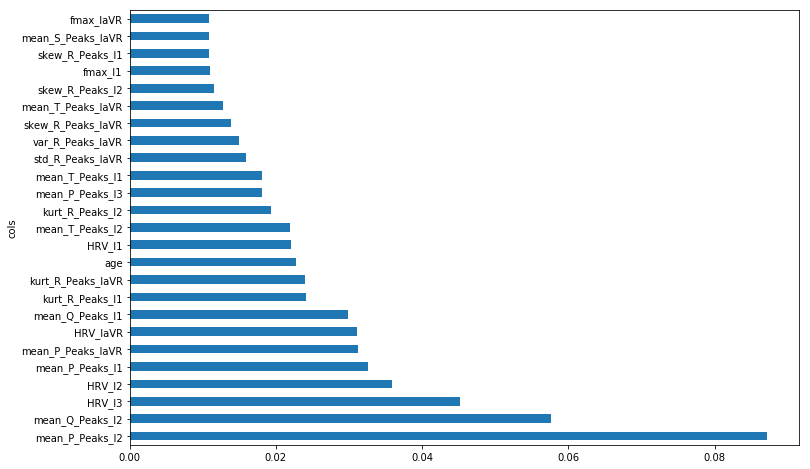

In [34]:
fi_af = rf_feat_importance(m_af, X_train)
plot_fi(fi_af[:25]);

In [35]:
to_keep = list(fi_af[fi_af['imp'] > 0.002].cols)

X_train_keep = X_train[to_keep]
X_valid_keep = X_valid[to_keep]

In [36]:
m_af = RandomForestClassifier(n_estimators=1000, min_samples_leaf=1, max_features='sqrt', n_jobs=7, oob_score=True)

%time m_af.fit(X_train_keep, y_train)

m_af.score(X_train_keep, y_train), m_af.score(X_valid_keep, y_valid), m_af.oob_score_

CPU times: user 44.6 s, sys: 159 ms, total: 44.7 s
Wall time: 8.02 s


(1.0, 0.9316363636363636, 0.9345692475463467)

In [37]:
print_fscores(m_af, X_valid_keep, y_valid)

[0.9259284269925674, 0.9804776015339028]


## Removing Redundant Features

In [32]:
from scipy.cluster import hierarchy as hc

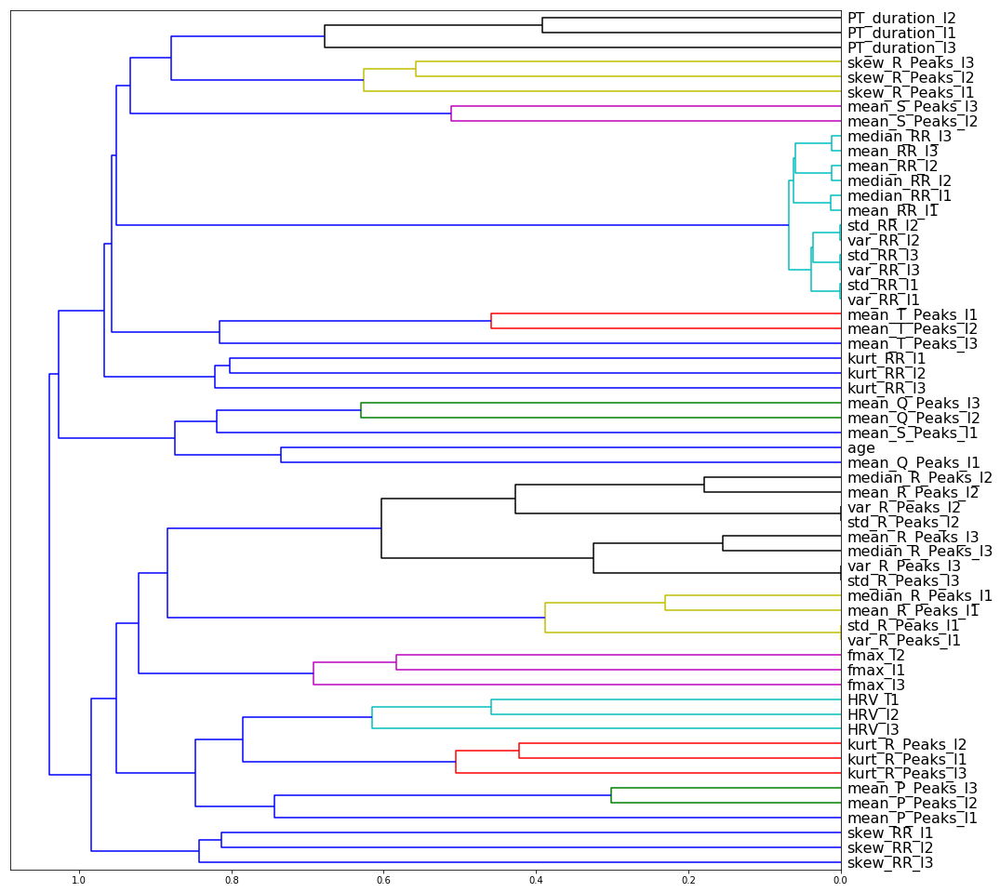

In [57]:
corr = np.round(scipy.stats.spearmanr(X_train_keep).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,17))
dendrogram = hc.dendrogram(z, labels=X_train_keep.columns, orientation='left', leaf_font_size=16)
plt.show()

In [39]:
to_drop = ['var_RR_l1', 'var_R_Peaks_l1', 'var_RR_l2', 'var_R_Peaks_l2', 'var_RR_l3', 'var_R_Peaks_l3', 'var_RR_laVR', 'var_R_Peaks_laVR']
X_train_drop = X_train_keep.drop(to_drop, axis=1)
X_valid_drop = X_valid_keep.drop(to_drop, axis=1)

In [40]:
m_af = RandomForestClassifier(n_estimators=1000, min_samples_leaf=1, max_features='sqrt', n_jobs=7, oob_score=True)

%time m_af.fit(X_train_drop, y_train)

m_af.score(X_train_drop, y_train), m_af.score(X_valid_drop, y_valid), m_af.oob_score_

CPU times: user 38.7 s, sys: 113 ms, total: 38.8 s
Wall time: 6.89 s


(1.0, 0.936, 0.9347509996364958)

In [41]:
print_fscores(m_af, X_valid_drop, y_valid)

[0.9309788617886178, 0.9820338391766963]


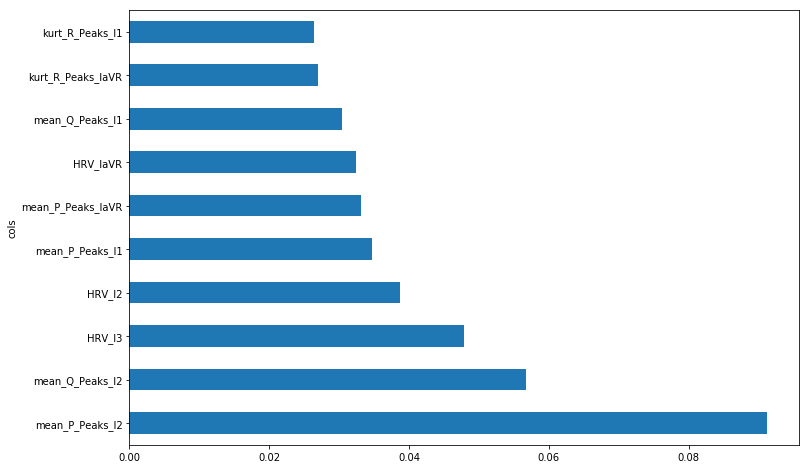

In [42]:
fi_af = rf_feat_importance(m_af, X_train_drop)
plot_fi(fi_af[:10]);